In [1]:
import anndata
import scanpy as sc
import scanpy
import numpy as np
import os

BATCH_LABELS = ("control", "TGFB1", "BMP9", "BMP9-TGFB1")

## Load data set

In [2]:
batches = {}

for batch in BATCH_LABELS:
    filename = "tgfb1-4-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    batches[batch] = anndata.read(filename)

batches

{'control': AnnData object with n_obs × n_vars = 1463 × 4590 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase', 'louvain', 'alk5 signature', 'alk1 signature', 'fibro signature', 'smc signature', 'osteo signature', 'ca2+ signature', 'apoptosis signature'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'phase_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced',
 'TGFB1': AnnData object with n_obs × n_vars = 1816 × 4606 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase', 'louvain', 'alk5 signature', 'alk1 signature', 'fibro signature', 'smc signature', 'osteo signature', 'ca2+ signature', 'apoptosis signature'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
  

## Re-compute UMAP plots

We will re-create the previously generated UMAP plots colored by UMAP clusters and some interesting genes.

creating UMAP for batch control


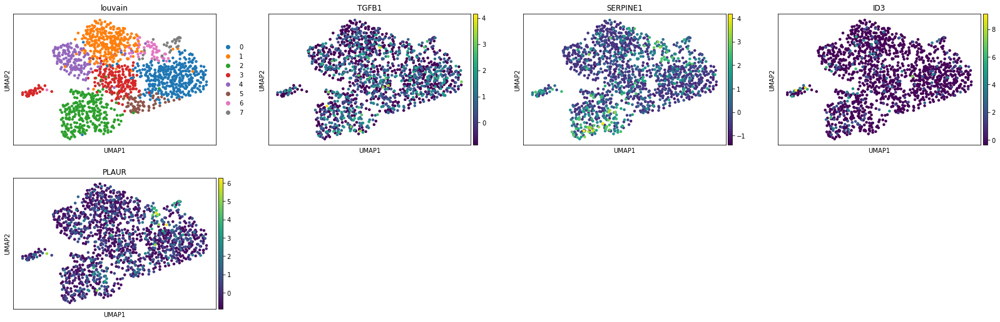

creating UMAP for batch TGFB1


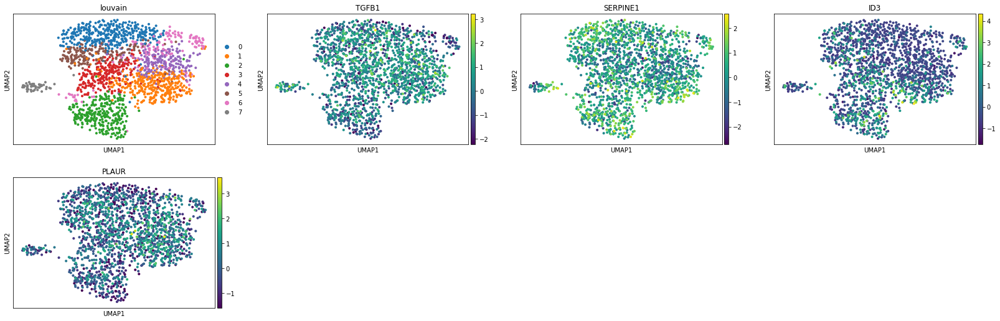

creating UMAP for batch BMP9


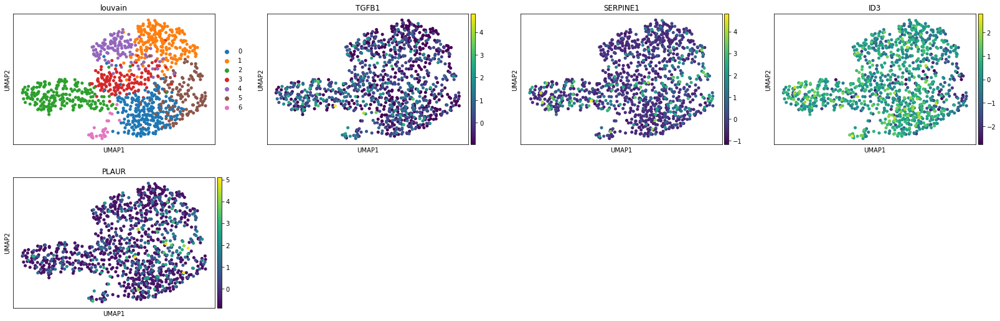

creating UMAP for batch BMP9-TGFB1


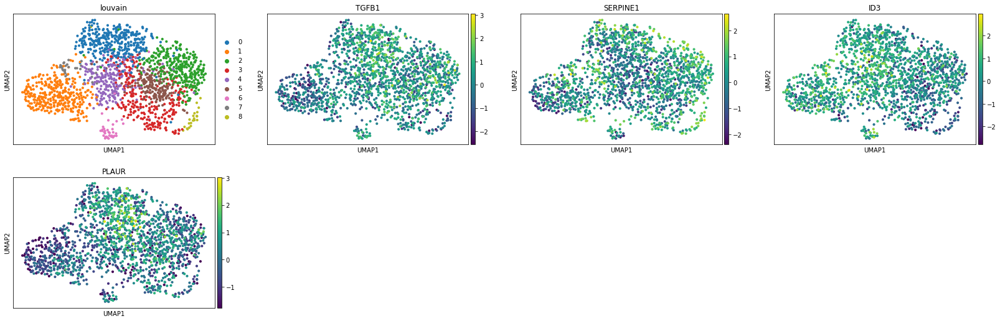

In [3]:
for batch, matrix in batches.items():
    print("creating UMAP for batch", batch)

    sc.pl.umap(matrix, color=['louvain', 'TGFB1', 'SERPINE1', 'ID3', 'PLAUR'])

## Finding marker genes per cluster

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the .raw attribute of AnnData is used in case it has been initialized before. We will use the Mann–Whitney–Wilcoxon test to compute this data.

marker genes per cluster for batch control


/d0/home/adamk/pysccnv/venv/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:388: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


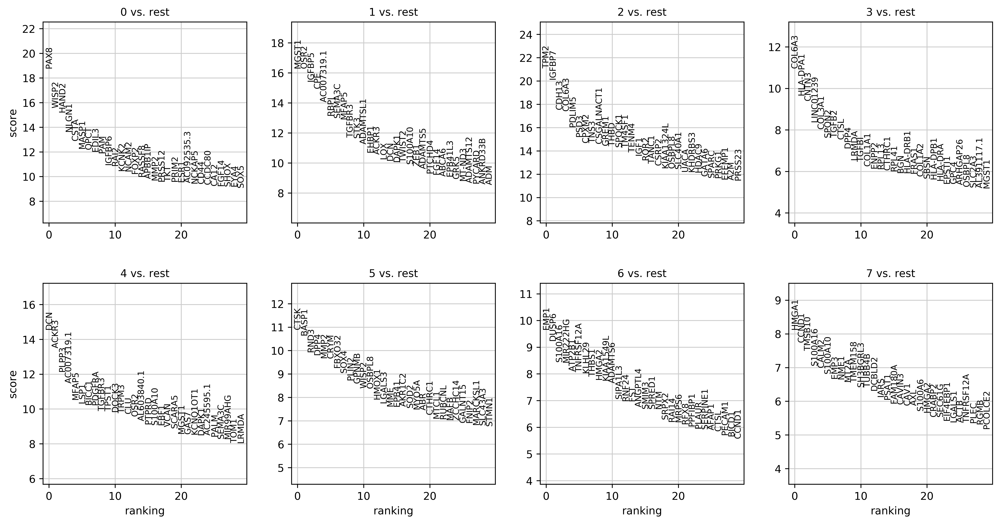

marker genes per cluster for batch TGFB1


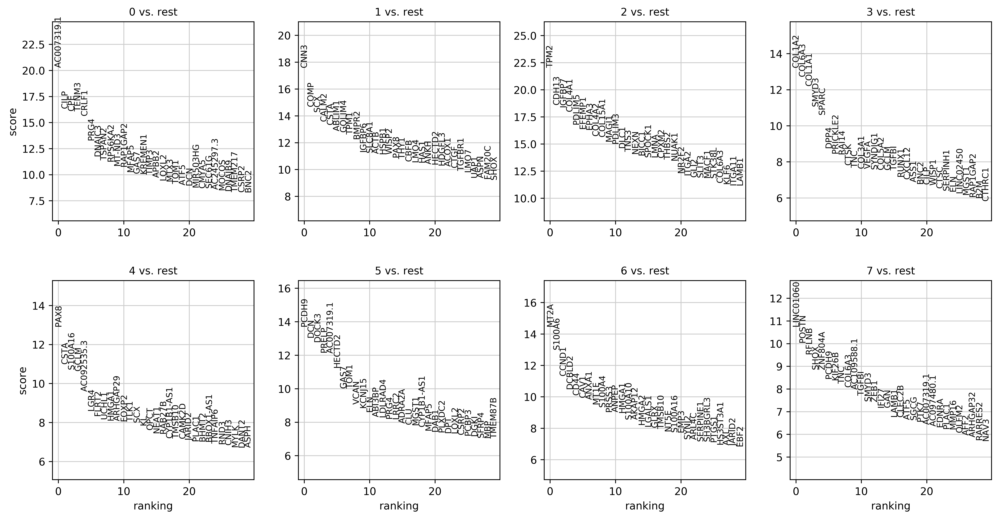

marker genes per cluster for batch BMP9


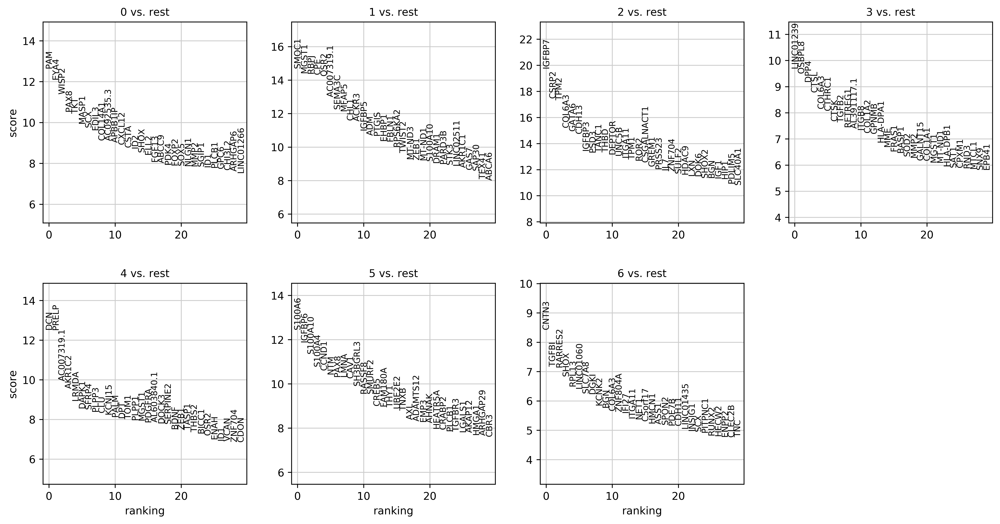

marker genes per cluster for batch BMP9-TGFB1


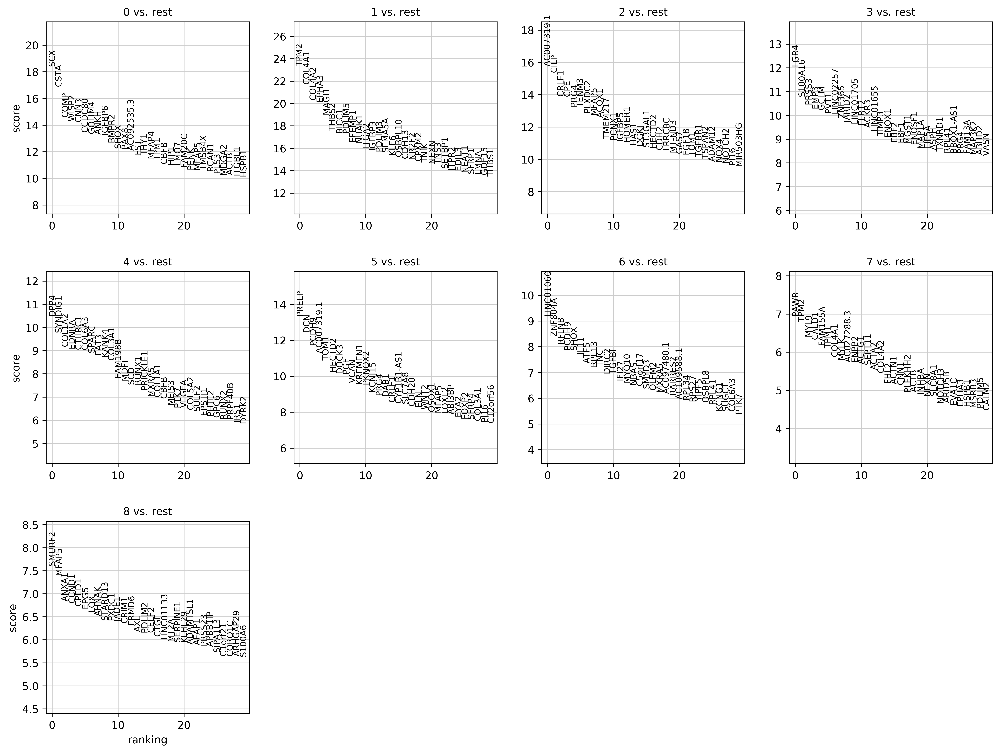

In [4]:
for batch, matrix in batches.items():
    print("marker genes per cluster for batch", batch)

    sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
    sc.tl.rank_genes_groups(matrix, 'louvain', method='wilcoxon', corr_method="benjamini-hochberg", n_genes=100)
    sc.pl.rank_genes_groups(matrix, n_genes=30, sharey=False)

## Some analysis I don't have the time to understand

TODO: go through this w/ Adam/Ange

In [ ]:
def magic_analysis(matrix, cluster_no, n):
    pvals_adj = np.array(matrix.uns['rank_genes_groups']['logfoldchanges'].tolist()).T[cluster_no][:n].tolist()
    #pvals_adj = np.array(adata.uns['rank_genes_groups']['pvals_adj'].tolist()).T[cluster_no][:n].tolist()
    names = np.array(matrix.uns['rank_genes_groups']['names'].tolist()).T[cluster_no][:n].tolist()
    genes = list(zip(names, pvals_adj))
    
    print("something with genes and logged p-values in cluster")
    
    for i, j in genes:
        print(i)
    
    print("now sorting genes by pvalue")
    genes.sort(key=lambda i: i[1], reverse=True)

    print("get those with pvalue > 1")
    for i, j in genes:
        if j > 1:
            print(i, j)
            
    print("get those with pvalue < -1")
    for i, j in genes:
        if j < -1:
            print(i, j)


In [ ]:
magic_analysis(batches["treated"], 4, 100)

In [ ]:
magic_analysis(batches["treated"], 5, 100)

In [ ]:
magic_analysis(batches["treated"], 0, 100)

In [ ]:
magic_analysis(batches["treated"], 3, 100)